# AIM: Adapting Image Models for Efficient Video Action Recognition (ICLR'23)

**Teaching Assistants:**
- Manjin Kim (mandos@postech.ac.kr)
- Jinsung Lee (jinsunglee@postech.ac.kr)

## Lab Overview

This lab session focuses on converting pre-trained image models into video action recognition models using a parameter-efficient method called AIM.

## Objectives

1. Understand the importance of temporal dynamics modeling in video action recognition
2. Explore frame sampling strategies and augmentation methods for transforming raw videos into 3D input tensors
3. Implement a parameter-efficient image-to-video transfer method, specifically transferring a CLIP ViT image encoder to a video model
4. Evaluate the trained video encoder's performance in categorizing action classes from video inputs

Through these exercises, you will gain practical experience in adapting image models for efficient video action recognition tasks.

Let's start by environment setup!
After running command lines in a cell below, you need to **RESTART** the colab.

In [1]:
#!git clone https://github.com/KimManjin/samsung_ai_lab.git
%cd aim_library/
!pip install git+https://github.com/openai/CLIP.git
!pip install -r requirements.txt
!python setup.py develop

/home/devrok/aiexpert/ai-vision/Action_recoginition/aim_library
  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-8jae3mrr
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-req-build-8jae3mrr
  Resolved https://github.com/openai/CLIP.git to commit dcba3cb2e2827b402d2701e7e1c7d9fed8a20ef1
  Preparing metadata (setup.py) ... done
DEPRECATION: pytorch-lightning 1.6.1 has a non-standard dependency specifier torch>=1.8.*. pip 24.1 will enforce this behaviour change. A possible replacement is to upgrade to a newer version of pytorch-lightning or contact the author to suggest that they release a version with a conforming dependency specifiers. Discussion can be found at https://github.com/pypa/pip/issues/12063
DEPRECATION: pytorch-lightning 1.6.1 has a non-standard dependency specifier torch>=1.8.*. pip 24.1 will enforce this behaviour change. A possible replacement is to upgrade to a newer version of pytorch-lightning or conta

In [2]:
import argparse
import os
import os.path as osp
import json
import warnings
from collections import OrderedDict
from typing import Tuple, Union
import numpy as np

import torch
import torch.nn as nn
import torch.nn.functional as F
import clip

from timm.models.layers import DropPath, to_2tuple, trunc_normal_

from mmcv import Config, DictAction
from mmcv.cnn import fuse_conv_bn
from mmcv.fileio.io import file_handlers
from mmcv.parallel import MMDataParallel, MMDistributedDataParallel
from mmcv.runner import get_dist_info, init_dist, load_checkpoint
from mmcv.runner.fp16_utils import wrap_fp16_model

from mmaction.datasets import build_dataloader, build_dataset
from mmaction.models import build_model
from mmaction.utils import register_module_hooks
from mmaction.datasets.pipelines import Compose
from mmaction.models.builder import BACKBONES
from mmaction.utils import get_root_logger

# TODO import test functions from mmcv and delete them from mmaction2
try:
    from mmcv.engine import multi_gpu_test, single_gpu_test
except (ImportError, ModuleNotFoundError):
    warnings.warn(
        'DeprecationWarning: single_gpu_test, multi_gpu_test, '
        'collect_results_cpu, collect_results_gpu from mmaction2 will be '
        'deprecated. Please install mmcv through master branch.')
    from mmaction.apis import multi_gpu_test, single_gpu_test


from IPython.display import display, HTML
from base64 import b64encode
from moviepy.editor import VideoFileClip

from einops import rearrange
import matplotlib.pyplot as plt

apex is not installed


### 1. Understand the importance of temporal dynamics modeling in video action recognition

### Diving48 dataset
Diving48 is a fine-grained video dataset of competitive diving, consisting of ~18k trimmed video clips of 48 unambiguous dive sequences (standardized by FINA). This proves to be a challenging task for modern action recognition systems as dives may differ in three stages (takeoff, flight, entry) and thus require modeling of long-term temporal dynamics.

### Description on action classes

Each of the 48 dive sequences are defined by a combination of takeoff (dive groups), movements in flight (somersaults and/or twists), and entry (dive positions). The prefix tree below summarizes all the dive classes present in the dataset.

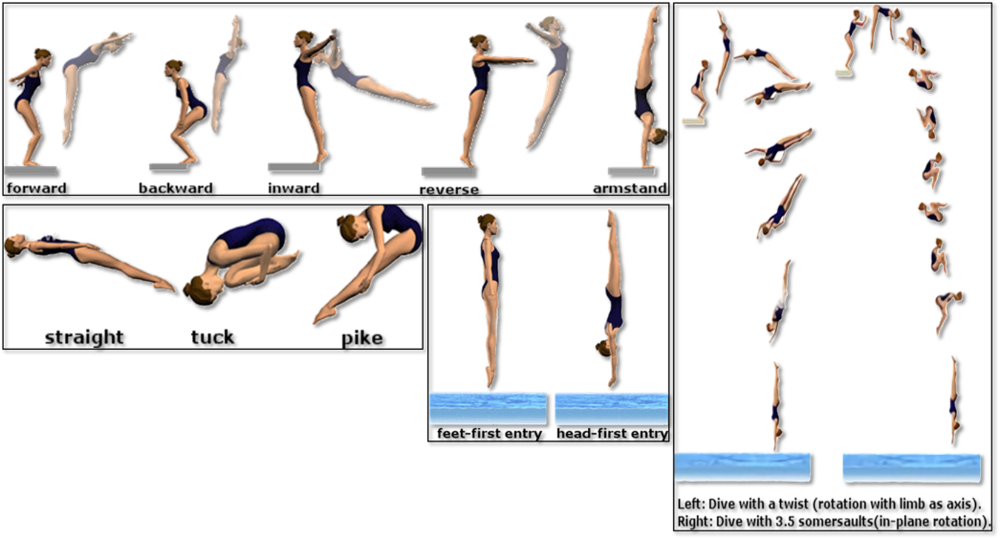

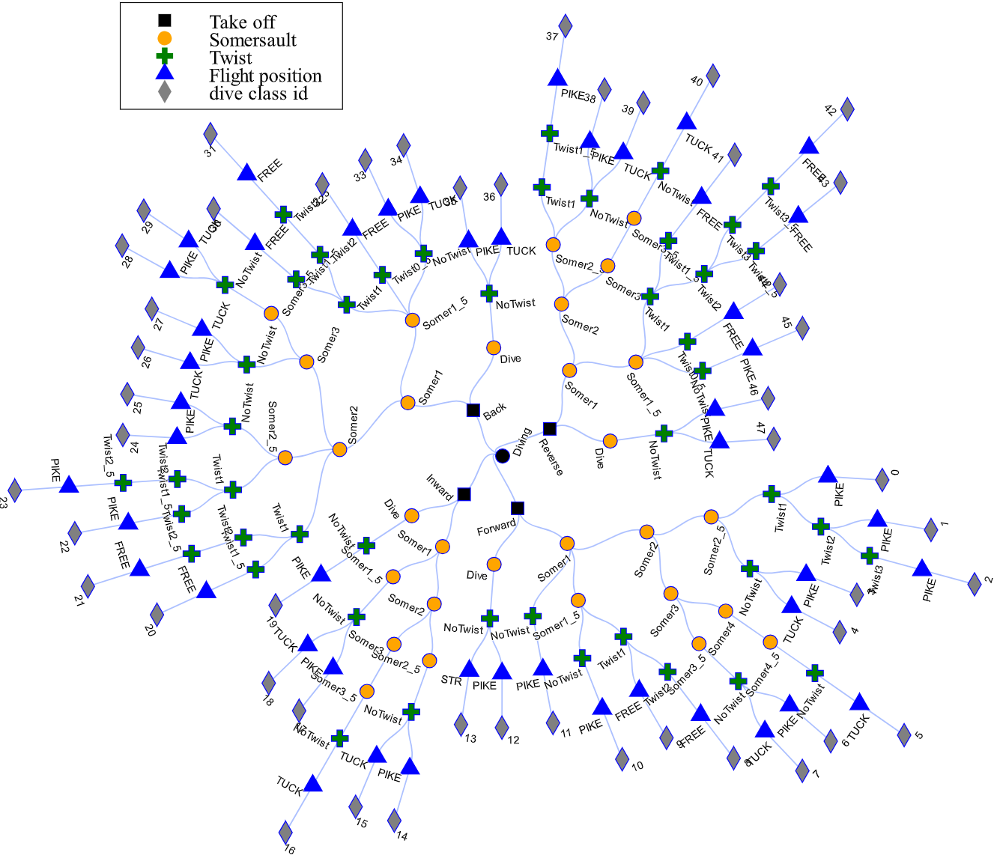

In [3]:
# Path to the JSON file
class_path = 'data/diving48/Diving48_vocab.json'
file_root = 'data/diving48/videos'
video_list = 'data/diving48/diving48_val_list_videos.txt'

# Load action classes
with open(class_path, 'r') as file:
    action_classes = json.load(file)
# Load video files
with open(video_list, 'r') as file:
    filenames = [osp.join(file_root, l.split(" ")[0]) for l in file]
# Load GT annotations
with open(video_list, 'r') as file:
    labels = [int(l.split(" ")[1]) for l in file]

Let's see one examplar video.

In [4]:
index = 0

mp4 = open(filenames[index],'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
print("Action class: {}".format(action_classes[labels[index]]))
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

Action class: ['Inward', '35som', 'NoTwis', 'TUCK']


### 2. Explore frame sampling strategies and augmentation methods for transforming raw videos into 3D input tensors



In [5]:
# Video info
video_infos = {'filename': filenames[index], 'label': labels[index], 'start_index': 0, 'modality': 'RGB'}
# normalization parameter
img_norm_cfg = dict(
    mean=[122.769, 116.74, 104.04], std=[68.493, 66.63, 70.321], to_bgr=False)

In [6]:
def visualize_video_frames(video_tensor, num_columns=16, figsize=(20, 2)):
    # Visualize video frames
    if video_tensor.dim() == 5:  # (batch, channel, frame, height, width)
        video_tensor = video_tensor.squeeze(0) # (batch*channel, frame, height, width)
    video_tensor = video_tensor.permute(1, 2, 3, 0)

    num_frames = video_tensor.shape[0]
    num_rows = (num_frames + num_columns - 1) // num_columns

    fig, axes = plt.subplots(num_rows, num_columns, figsize=(figsize[0], figsize[1] * num_rows))
    axes = axes.flatten()

    for i in range(num_frames):
        frame = video_tensor[i]
        frame = frame.cpu().numpy()
        frame = (frame - frame.min()) / (frame.max() - frame.min())
        axes[i].imshow(frame)
        axes[i].axis('off')

    for i in range(num_frames, len(axes)):
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()

A shape of video tensor: torch.Size([1, 3, 48, 480, 640])


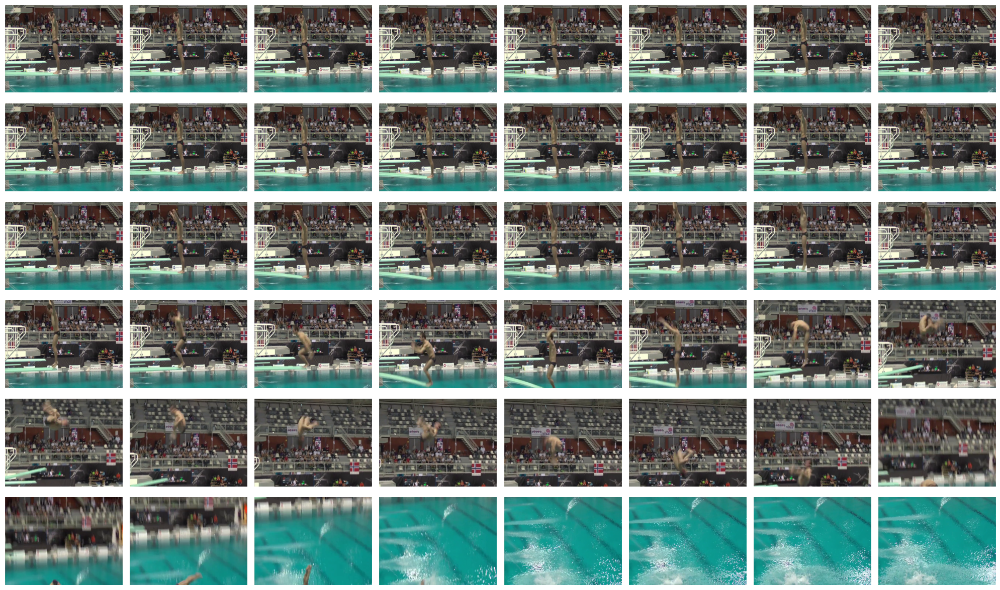

In [7]:
# Build video transformation pipeline, which converts raw video frame inputs into PyTorch tensors
pipeline = [
    dict(type='DecordInit'),
    dict(type='SampleFrames',
        clip_len=48,
        frame_interval=1,
        num_clips=1,
        frame_uniform=True,
        test_mode=True),
    dict(type='DecordDecode'),
    dict(type='FormatShape', input_format='NCTHW'),
    dict(type='Collect', keys=['imgs', 'label'], meta_keys=[]),
    dict(type='ToTensor', keys=['imgs'])
]

transform = Compose(pipeline)
video_tensor = transform(video_infos)
print("A shape of video tensor: {}".format(video_tensor['imgs'].shape))
visualize_video_frames(video_tensor['imgs'], num_columns=8)

### 1. Uniform Sampling
Frames are sampled at regular intervals across the entire video, providing a consistent and even representation of the video content.

**Advantages:**
- **Balanced Information:** Prevents over-representation of any specific part of the video, resulting in a balanced dataset.

**Disadvantages:**
- **Potential Information Loss:** Important events that occur between sampled intervals may be missed, particularly if they are brief or happen suddenly.

### 2. Dense Sampling
Frames are sampled more densely within shorter intervals, focusing on capturing detailed information in specific segments of the video.

**Advantages:**
- **Temporal Consistency:** Close sampling of frames ensures that consecutive frames are similar, leading to a more stable and consistent learning.
- **Detailed Capture:** Increases the likelihood of capturing important or rapid events that occur within shorter period of time.

**Disadvantages:**
- **frame redundancy:** If the sampling stride is too low, the sampled frames would be highly redundant.
- **Limited Generalization:** The focus on specific segments may reduce the ability to generalize across the entire video.

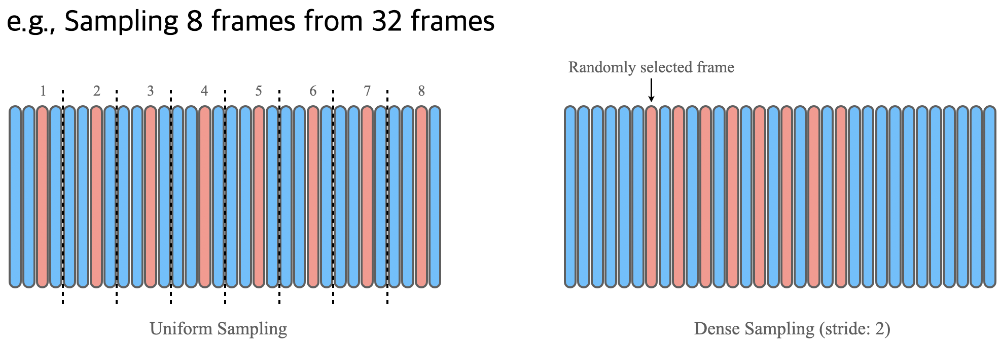

Let's compare the two frame sampling strategies.

Uniform sampling
A shape of video tensor: torch.Size([1, 3, 8, 480, 640])


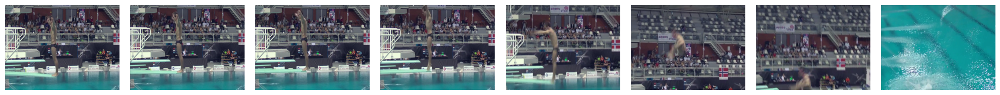

Dense sampling
A shape of video tensor: torch.Size([1, 3, 8, 480, 640])


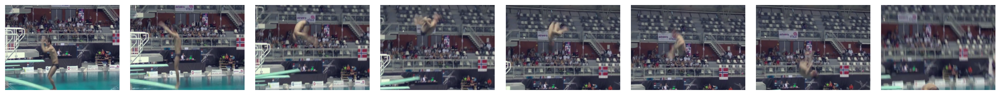

In [8]:
# Include the sampling strategies in the video transformation pipeline
uniform_smpl_pipeline = [
    dict(type='DecordInit'),
    dict(type='SampleFrames',
            clip_len=8, # number of frames to sample for each clip
            frame_interval=2, # does not affect if frame_uniform==True
            num_clips=1,
            frame_uniform=True, # whether to use uniform sampling
            test_mode=False),
    dict(type='DecordDecode'),
    dict(type='Normalize', **img_norm_cfg),
    dict(type='FormatShape', input_format='NCTHW'),
    dict(type='Collect', keys=['imgs', 'label'], meta_keys=[]),
    dict(type='ToTensor', keys=['imgs', 'label'])
]

dense_smpl_pipeline = [
    dict(type='DecordInit'),
    dict(type='SampleFrames',
            clip_len=8,
            frame_interval=5,
            num_clips=1,
            frame_uniform=False
       ),
    dict(type='DecordDecode'),
    dict(type='Normalize', **img_norm_cfg),
    dict(type='FormatShape', input_format='NCTHW'),
    dict(type='Collect', keys=['imgs', 'label'], meta_keys=[]),
    dict(type='ToTensor', keys=['imgs', 'label'])
]

transform_uniform = Compose(uniform_smpl_pipeline)
uniform_tensor = transform_uniform(video_infos)


###### TODO: define transform_dense, dense_tensor ###########
transform_dense = Compose(dense_smpl_pipeline)
dense_tensor = transform_dense(video_infos)

print("Uniform sampling")
print("A shape of video tensor: {}".format(uniform_tensor['imgs'].shape))
visualize_video_frames(uniform_tensor['imgs'], num_columns=8)
print("Dense sampling")
print("A shape of video tensor: {}".format(dense_tensor['imgs'].shape))
visualize_video_frames(dense_tensor['imgs'], num_columns=8)

### Video augmentation methods

Augmentation transforms the input data in trivial ways that do not affect the essence of the input information.
When applying augmentations to a video input, one needs to make sure augmentations do not harm the temporal consistency of the video.

In the example below, we randomly resize the input frames and apply random horizontal fliping.

A shape of video tensor: torch.Size([1, 3, 8, 224, 224])


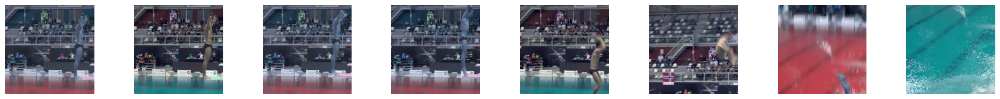

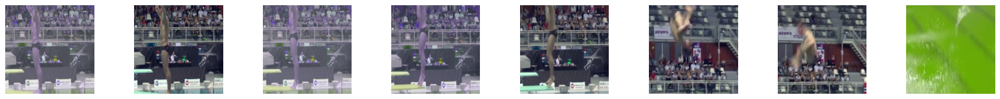

In [9]:
# Include augmentation information in the video transformation pipeline
aug_pipeline = [
    dict(type='DecordInit'),
    dict(type='SampleFrames',
            clip_len=8,
            frame_interval=1,
            num_clips=1,
            frame_uniform=True),
    dict(type='DecordDecode'),
    dict(type='Resize', scale=(-1, 256)),
    dict(type='RandomResizedCrop'),
    dict(type='Resize', scale=(224, 224), keep_ratio=False),
    dict(type='ColorJitter', color_space_aug=True), # by default the jittering pattern of ColorJitter differs every frame
    dict(type='Flip', flip_ratio=0.5),
    dict(type='Normalize', **img_norm_cfg),
    dict(type='FormatShape', input_format='NCTHW'),
    dict(type='Collect', keys=['imgs', 'label'], meta_keys=[]),
    dict(type='ToTensor', keys=['imgs', 'label'])
]

transform_aug = Compose(aug_pipeline)
aug_tensor = transform_aug(video_infos)
aug_tensor2 = transform_aug(video_infos)

print("A shape of video tensor: {}".format(aug_tensor['imgs'].shape))
visualize_video_frames(aug_tensor['imgs'], num_columns=8)
visualize_video_frames(aug_tensor2['imgs'], num_columns=8)

### 3. Implement a parameter-efficient image-to-video transfer method, specifically transferring a CLIP ViT image encoder to a video model

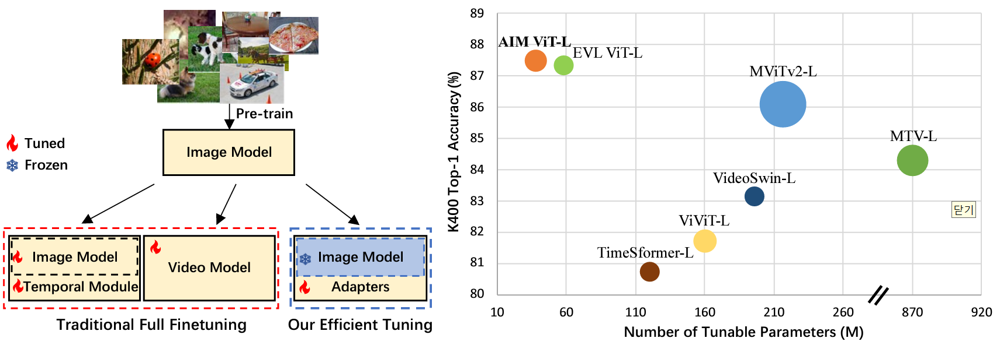

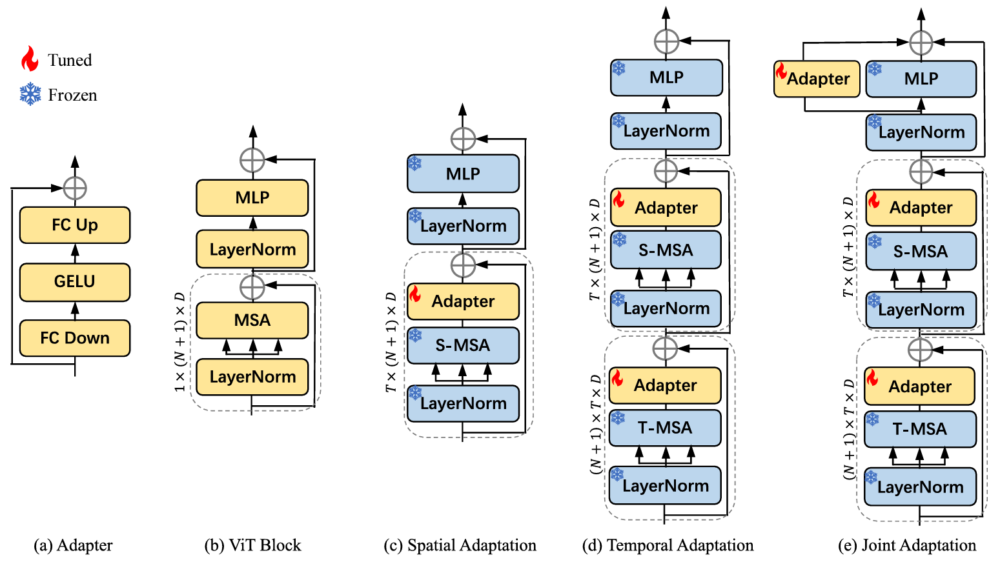

In [10]:
class Adapter(nn.Module):
    def __init__(self, D_features, mlp_ratio=0.25, act_layer=nn.GELU, skip_connect=True):
        super().__init__()
        self.skip_connect = skip_connect # whether to use residual connection
        D_hidden_features = int(D_features * mlp_ratio)
        self.act = act_layer()
        self.D_fc1 = nn.Linear(D_features, D_hidden_features)
        self.D_fc2 = nn.Linear(D_hidden_features, D_features)

    def forward(self, x):
        # x is (BT, HW+1, D)
        #####  TODO: see the figure (a) Adapter, and complete the forward function                   ######
        #####        be sure to use self.skip_connect, self.act, self.D_fc1, self.D_fc2 we defined above! #
        identity = x

        x = self.D_fc2(self.act(self.D_fc1(x)))

        if self.skip_connect:
          x = x + identity

        return x

In [11]:
# Check if the implementation is correct.
B, T, H, W, D = 1, 8, 14, 14, 32
input = torch.randn(H*W+1, B*T, D)
adapter = Adapter(D)
out = adapter(input)
print(out.shape)

torch.Size([197, 8, 32])


In [12]:
class LayerNorm(nn.LayerNorm):
    """Subclass torch's LayerNorm to handle fp16."""

    def forward(self, x: torch.Tensor):
        orig_type = x.dtype
        ret = super().forward(x.type(torch.float32))
        return ret.type(orig_type)


class QuickGELU(nn.Module):
    def forward(self, x: torch.Tensor):
        return x * torch.sigmoid(1.702 * x)

In [13]:
class ResidualAttentionBlock(nn.Module):
    def __init__(self, d_model: int, n_head: int, attn_mask: torch.Tensor = None, scale=1., num_tadapter=1, num_frames=8, drop_path=0.):
        super().__init__()

        # Define attention and MLP layers in transformer block.
        self.attn = nn.MultiheadAttention(d_model, n_head)
        self.ln_1 = LayerNorm(d_model)
        self.mlp = nn.Sequential(OrderedDict([
            ("c_fc", nn.Linear(d_model, d_model * 4)),
            ("gelu", QuickGELU()),
            ("c_proj", nn.Linear(d_model * 4, d_model))
        ]))
        self.ln_2 = LayerNorm(d_model)
        self.attn_mask = attn_mask
        self.n_head = n_head

        # Define adapter layers
        self.num_tadapter = num_tadapter
        self.S_Adapter = Adapter(d_model)
        self.T_Adapter = Adapter(d_model, skip_connect=False)
        self.MLP_Adapter = Adapter(d_model, skip_connect=False)
        self.scale = scale
        if num_tadapter == 2:
            self.T_Adapter_in = Adapter(d_model)

        self.num_frames = num_frames
        self.drop_path = DropPath(drop_path) if drop_path > 0. else nn.Identity()

    def attention(self, x: torch.Tensor):
        self.attn_mask = self.attn_mask.to(dtype=x.dtype, device=x.device) if self.attn_mask is not None else None
        return self.attn(x, x, x, need_weights=False, attn_mask=self.attn_mask)[0]

    def forward(self, x: torch.Tensor):
        ## The implementation of the figure (e) Joint Adaptation
        ## x shape [HW+1, BT, D]
        n, bt, d = x.shape
        xt = rearrange(x, 'n (b t) d -> t (b n) d', t=self.num_frames)
        if self.num_tadapter == 2:
            xt = self.T_Adapter(self.attention(self.T_Adapter_in(self.ln_1(xt))))
        else:
            ## TODO: the first block of (e) #######
            xt = self.T_Adapter(self.attention(self.ln_1(xt)))                               #
            #######################################
        xt = rearrange(xt, 't (b n) d -> n (b t) d', n=n)
        x = x + self.drop_path(xt)
        ## TODO: the second block of (e) #######################
        x = self.S_Adapter(self.attention(self.ln_2(x)))                                                  #
        ########################################################
        ## joint adaptation: the third block of (e)
        xn = self.ln_2(x)
        x = x + self.mlp(xn) + self.drop_path(self.scale * self.MLP_Adapter(xn))
        return x

class Transformer(nn.Module):
    def __init__(self, num_frames, width: int, layers: int, heads: int, attn_mask: torch.Tensor = None, num_tadapter=1, scale=1., drop_path=0.1):
        super().__init__()
        self.width = width
        self.layers = layers
        dpr = [x.item() for x in torch.linspace(0, drop_path, self.layers)]
        ## we stack the block (e) for self.layers times
        self.resblocks = nn.Sequential(*[ResidualAttentionBlock(width, heads, attn_mask, scale, num_tadapter, num_frames, dpr[i]) for i in range(layers)])

    def forward(self, x: torch.Tensor):
        return self.resblocks(x)

In [14]:
# Check if the implementation is correct.
B, T, H, W, D = 1, 8, 14, 14, 768
input = torch.randn(H*W+1, B*T, D)
transformer = Transformer(
    num_frames = T,
    width = D,
    layers = 12,
    heads = 12,
    num_tadapter = 1,
)
out = transformer(input)
print(out.shape)

torch.Size([197, 8, 768])


In [15]:
class ViT_CLIP(nn.Module):
    ## ViT definition in CLIP image encoder
    def __init__(self,
                 input_resolution: int,
                 num_frames: int,
                 patch_size: int,
                 width: int,
                 layers: int,
                 heads: int,
                 drop_path_rate,
                 num_tadapter=1,
                 adapter_scale=0.5,
                 pretrained=None):
        super().__init__()
        self.input_resolution = input_resolution
        self.pretrained = pretrained
        self.conv1 = nn.Conv2d(in_channels=3, out_channels=width, kernel_size=patch_size, stride=patch_size, bias=False)

        scale = width ** -0.5
        self.layers = layers
        self.class_embedding = nn.Parameter(scale * torch.randn(width))
        self.positional_embedding = nn.Parameter(scale * torch.randn((input_resolution // patch_size) ** 2 + 1, width))
        self.ln_pre = LayerNorm(width)

        self.num_frames = num_frames
        self.temporal_embedding = nn.Parameter(torch.zeros(1, num_frames, width))

        self.transformer = Transformer(num_frames, width, layers, heads, num_tadapter=num_tadapter, scale=adapter_scale, drop_path=drop_path_rate)

        self.ln_post = LayerNorm(width)

    def init_weights(self, pretrained=None):
        def _init_weights(m):
            if isinstance(m, nn.Linear):
                trunc_normal_(m.weight, std=.02)
                if isinstance(m, nn.Linear) and m.bias is not None:
                    nn.init.constant_(m.bias, 0)
            elif isinstance(m, nn.LayerNorm):
                nn.init.constant_(m.bias, 0)
                nn.init.constant_(m.weight, 1.0)

        if pretrained:
            self.pretrained = pretrained
        if isinstance(self.pretrained, str):
            self.apply(_init_weights)
            # logger = get_root_logger()
            logger.info(f'load model from: {self.pretrained}')
            ## Load OpenAI CLIP pretrained weights
            if self.layers == 12:
                clip_model, _ = clip.load("ViT-B/16", device="cpu")
            else:
                clip_model, _ = clip.load("ViT-L/14", device="cpu")
            pretrain_dict = clip_model.visual.state_dict()
            del clip_model
            del pretrain_dict['proj']
            msg = self.load_state_dict(pretrain_dict, strict=False)
            logger.info('Missing keys: {}'.format(msg.missing_keys))
            logger.info('Unexpected keys: {}'.format(msg.unexpected_keys))
            logger.info(f"=> loaded successfully '{self.pretrained}'")
            torch.cuda.empty_cache()
        elif self.pretrained is None:
            self.apply(_init_weights)
        else:
            raise TypeError('pretrained must be a str or None')

        ## initialize S_Adapter
        for n, m in self.transformer.named_modules():
            if 'S_Adapter' in n:
                for n2, m2 in m.named_modules():
                    if 'D_fc2' in n2:
                        if isinstance(m2, nn.Linear):
                            ## TODO: initialize the weights and biases of m2 to 0 ###
                            nn.init.constant_(m2.bias, 0)
                            nn.init.constant_(m2.weight, 0)

        ## initialize T_Adapter
        for n, m in self.transformer.named_modules():
            if 'T_Adapter' in n:
                for n2, m2 in m.named_modules():
                    if 'D_fc2' in n2:
                        if isinstance(m2, nn.Linear):
                            ## TODO: initialize the weights and biases of m2 to 0 ###
                            nn.init.constant_(m2.bias, 0)
                            nn.init.constant_(m2.weight, 0)

        ## initialize MLP_Adapter
        for n, m in self.transformer.named_modules():
            if 'MLP_Adapter' in n:
                for n2, m2 in m.named_modules():
                    if 'D_fc2' in n2:
                        if isinstance(m2, nn.Linear):
                            ## TODO: initialize the weights and biases of m2 to 0 ###
                            nn.init.constant_(m2.bias, 0)
                            nn.init.constant_(m2.weight, 0)

    def freeze_backbone(self):
        for name, param in self.named_parameters():
            if 'temporal_embedding' not in name and 'ln_post' not in name and 'cls_head' not in name and 'Adapter' not in name:
                ## TODO: freeze parameters in the original ViT ###
                param.requires_grad = False

    @torch.jit.ignore
    def no_weight_decay(self):
        return {'absolute_pos_embed', 'temporal_embedding'}

    @torch.jit.ignore
    def no_weight_decay_keywords(self):
        return {'relative_position_bias_table', 'temporal_position_bias_table'}

    def forward(self, x: torch.Tensor):
        B, C, T, H, W = x.shape
        x = rearrange(x, 'b c t h w -> (b t) c h w')
        x = self.conv1(x)
        x = x.reshape(x.shape[0], x.shape[1], -1)
        x = x.permute(0, 2, 1)
        x = torch.cat([self.class_embedding.to(x.dtype) + torch.zeros(x.shape[0], 1, x.shape[-1], dtype=x.dtype, device=x.device), x], dim=1)
        x = x + self.positional_embedding.to(x.dtype)

        n = x.shape[1]
        x = rearrange(x, '(b t) n d -> (b n) t d', t=self.num_frames)
        x = x + self.temporal_embedding
        x = rearrange(x, '(b n) t d -> (b t) n d', n=n)

        x = self.ln_pre(x)

        x = x.permute(1, 0, 2)  # NLD -> LND
        x = self.transformer(x)
        x = x.permute(1, 0, 2)  # LND -> NLD
        x = self.ln_post(x)
        x = x[:, 0]
        x = rearrange(x, '(b t) d -> b d t',b=B,t=T)

        x = x.unsqueeze(-1).unsqueeze(-1)  # BDTHW for I3D head

        return x

Now, let's load and initialize the defined model!
If done properly, we will see the adapter weights not being initialized with pretrained CLIP weights.

In [16]:
# Manually configure hyperparameters
input_resolution = 224
num_frames = 8
patch_size = 16
width = 768
layers = 12
heads = 12
drop_path_rate = 0.1
num_tadapter=1
adapter_scale=0.5
pretrained="openaiclip"

logger = get_root_logger()

model = ViT_CLIP(input_resolution=input_resolution,
                  num_frames=num_frames,
                  patch_size=patch_size,
                  width=width,
                  layers=layers,
                  heads=heads,
                  drop_path_rate=drop_path_rate,
                  num_tadapter=num_tadapter,
                  adapter_scale=adapter_scale,
                  pretrained=pretrained)

model.init_weights()
model.freeze_backbone()

2024-08-16 16:22:03,321 - mmaction - INFO - load model from: openaiclip
2024-08-16 16:22:06,235 - mmaction - INFO - Missing keys: ['temporal_embedding', 'transformer.resblocks.0.S_Adapter.D_fc1.weight', 'transformer.resblocks.0.S_Adapter.D_fc1.bias', 'transformer.resblocks.0.S_Adapter.D_fc2.weight', 'transformer.resblocks.0.S_Adapter.D_fc2.bias', 'transformer.resblocks.0.T_Adapter.D_fc1.weight', 'transformer.resblocks.0.T_Adapter.D_fc1.bias', 'transformer.resblocks.0.T_Adapter.D_fc2.weight', 'transformer.resblocks.0.T_Adapter.D_fc2.bias', 'transformer.resblocks.0.MLP_Adapter.D_fc1.weight', 'transformer.resblocks.0.MLP_Adapter.D_fc1.bias', 'transformer.resblocks.0.MLP_Adapter.D_fc2.weight', 'transformer.resblocks.0.MLP_Adapter.D_fc2.bias', 'transformer.resblocks.1.S_Adapter.D_fc1.weight', 'transformer.resblocks.1.S_Adapter.D_fc1.bias', 'transformer.resblocks.1.S_Adapter.D_fc2.weight', 'transformer.resblocks.1.S_Adapter.D_fc2.bias', 'transformer.resblocks.1.T_Adapter.D_fc1.weight', 'tran

In [17]:
for n, m in model.named_parameters():
    if 'S_Adapter.D_fc2' in n:
        print(m)

Parameter containing:
tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]], requires_grad=True)
Parameter containing:
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

In [18]:
for name, param in model.named_parameters():
        if param.requires_grad:
                logger.info('{}: {}'.format(name, param.requires_grad))
        num_param = sum(p.numel() for p in model.parameters() if p.requires_grad)
        num_total_param = sum(p.numel() for p in model.parameters())
logger.info('Number of total parameters: {}, tunable parameters: {} ({}%)'.format(num_total_param, num_param, round(num_param / num_total_param, 4) * 100))

2024-08-16 16:22:10,200 - mmaction - INFO - temporal_embedding: True
2024-08-16 16:22:10,217 - mmaction - INFO - transformer.resblocks.0.S_Adapter.D_fc1.weight: True
2024-08-16 16:22:10,218 - mmaction - INFO - transformer.resblocks.0.S_Adapter.D_fc1.bias: True
2024-08-16 16:22:10,219 - mmaction - INFO - transformer.resblocks.0.S_Adapter.D_fc2.weight: True
2024-08-16 16:22:10,221 - mmaction - INFO - transformer.resblocks.0.S_Adapter.D_fc2.bias: True
2024-08-16 16:22:10,222 - mmaction - INFO - transformer.resblocks.0.T_Adapter.D_fc1.weight: True
2024-08-16 16:22:10,223 - mmaction - INFO - transformer.resblocks.0.T_Adapter.D_fc1.bias: True
2024-08-16 16:22:10,224 - mmaction - INFO - transformer.resblocks.0.T_Adapter.D_fc2.weight: True
2024-08-16 16:22:10,226 - mmaction - INFO - transformer.resblocks.0.T_Adapter.D_fc2.bias: True
2024-08-16 16:22:10,227 - mmaction - INFO - transformer.resblocks.0.MLP_Adapter.D_fc1.weight: True
2024-08-16 16:22:10,228 - mmaction - INFO - transformer.resblock

### 4. Evaluate the trained video encoder's performance in categorizing action classes from video inputs

<u>IMPORTANT</u>: you have to download a [Diving48-pretrained AIM ViT-B network](https://drive.google.com/file/d/1YMEWV8HM0v1hkq3-35gNGjh_DMDeC-cn/view?usp=share_link) and then upload it to your google drive.

In [19]:
!gdown --id 1tefRGIQvEq1XLN2HBVwas7mVO3XuQADw -O ../

/home/devrok/.conda/envs/snuenv_pt/lib/python3.10/site-packages/gdown/__main__.py:140: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From (original): https://drive.google.com/uc?id=1tefRGIQvEq1XLN2HBVwas7mVO3XuQADw
From (redirected): https://drive.google.com/uc?id=1tefRGIQvEq1XLN2HBVwas7mVO3XuQADw&confirm=t&uuid=fafb2e11-a73f-4354-a6fb-d87b1e8310f1
To: /home/devrok/aiexpert/ai-vision/Action_recoginition/vit_b_clip_32frame_diving48.pth
100%|████████████████████████████████████████| 386M/386M [00:26<00:00, 14.6MB/s]


In [20]:
parser = argparse.ArgumentParser(
        description='AIM test (and eval) a model')
args = parser.parse_args("")
args.eval = 'top_k_accuracy'
args.config = "configs/recognition/vit/vitclip_base_diving48.py"
# args.checkpoint = #<Checkpoint_path>
args.checkpoint = "../vit_b_clip_32frame_diving48.pth"
args.launcher = 'none'
args.cfg_options = {}
args.eval_options = {}
args.options = {}
args.out = None

In [21]:
def turn_off_pretrained(cfg):
    # recursively find all pretrained in the model config,
    # and set them None to avoid redundant pretrain steps for testing
    if 'pretrained' in cfg:
        cfg.pretrained = None

    # recursively turn off pretrained value
    for sub_cfg in cfg.values():
        if isinstance(sub_cfg, dict):
            turn_off_pretrained(sub_cfg)


def inference_pytorch(args, cfg, data_loader):
    """Get predictions by pytorch models."""
    # remove redundant pretrain steps for testing
    turn_off_pretrained(cfg.model)

    # build the model and load checkpoint
    model = build_model(
        cfg.model, train_cfg=None, test_cfg=cfg.get('test_cfg'))

    if len(cfg.module_hooks) > 0:
        register_module_hooks(model, cfg.module_hooks)

    fp16_cfg = cfg.get('fp16', None)
    if fp16_cfg is not None:
        wrap_fp16_model(model)
    load_checkpoint(model, args.checkpoint, map_location='cpu')

    model = MMDataParallel(model, device_ids=[0])
    outputs = single_gpu_test(model, data_loader)

    return outputs

In [22]:
cfg = Config.fromfile(args.config)

cfg.merge_from_dict(args.cfg_options)

# Load output_config from cfg
output_config = cfg.get('output_config', {})
if args.out:
    # Overwrite output_config from args.out
    output_config = Config._merge_a_into_b(
        dict(out=args.out), output_config)

# Load eval_config from cfg
eval_config = cfg.get('eval_config', {})
if args.eval:
    # Overwrite eval_config from args.eval
    eval_config = Config._merge_a_into_b(
        dict(metrics=args.eval), eval_config)
if args.eval_options:
    # Add options from args.eval_options
    eval_config = Config._merge_a_into_b(args.eval_options, eval_config)

assert output_config or eval_config, \
    ('Please specify at least one operation (save or eval the '
        'results) with the argument "--out" or "--eval"')

# set cudnn benchmark
if cfg.get('cudnn_benchmark', False):
    torch.backends.cudnn.benchmark = True
cfg.data.test.test_mode = True

# The flag is used to register module's hooks
cfg.setdefault('module_hooks', [])

# build the dataloader
dataset = build_dataset(cfg.data.test, dict(test_mode=True))
dataloader_setting = dict(
    videos_per_gpu=cfg.data.get('videos_per_gpu', 1),
    workers_per_gpu=cfg.data.get('workers_per_gpu', 1),
    dist=False,
    shuffle=False)
dataloader_setting = dict(dataloader_setting,
                            **cfg.data.get('test_dataloader', {}))
data_loader = build_dataloader(dataset, **dataloader_setting)

# execute inference on video samples (total 50 videos)
outputs = inference_pytorch(args, cfg, data_loader)

# log control
rank, _ = get_dist_info()
if rank == 0:
    if output_config.get('out', None):
        out = output_config['out']
        print(f'\nwriting results to {out}')
        dataset.dump_results(outputs, **output_config)
    if eval_config:
        eval_res = dataset.evaluate(outputs, **eval_config)
        for name, val in eval_res.items():
            print(f'{name}: {val:.04f}')

load checkpoint from local path: ../vit_b_clip_32frame_diving48.pth
[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 50/50, 1.0 task/s, elapsed: 48s, ETA:     0s
Evaluating top_k_accuracy ...

top1_acc	0.8000
top5_acc	1.0000
top1_acc: 0.8000
top5_acc: 1.0000


In [23]:
labels = np.array(labels)
preds = np.array(outputs).argmax(axis=-1)

In [24]:
# visualize a correctly predicted video sample
index = 1
mp4 = open(filenames[index],'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
print("GT: {}".format(action_classes[labels[index]]))
print("Pred: {}".format(action_classes[preds[index]]))
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

GT: ['Inward', 'Dive', 'NoTwis', 'PIKE']
Pred: ['Inward', 'Dive', 'NoTwis', 'PIKE']


Let's take a look at some examples of misclassified videos.

In [25]:
GT_match = labels == preds
failed_samples = np.where(GT_match == False)[0]

In [26]:
# visualize an incorrectly predicted video sample
index = failed_samples[0]
mp4 = open(filenames[index],'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
print("GT: {}".format(action_classes[labels[index]]))
print("Pred: {}".format(action_classes[preds[index]]))
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

GT: ['Inward', '35som', 'NoTwis', 'TUCK']
Pred: ['Inward', '25som', 'NoTwis', 'TUCK']


Among misclassified videos, we will analyze which label subcategory has led the videos to misclassification.

In [27]:
p = np.array([action_classes[idx] for idx in preds[failed_samples]])
g = np.array([action_classes[idx] for idx in labels[failed_samples]])
correct = (p == g).sum(axis=0) / len(p)

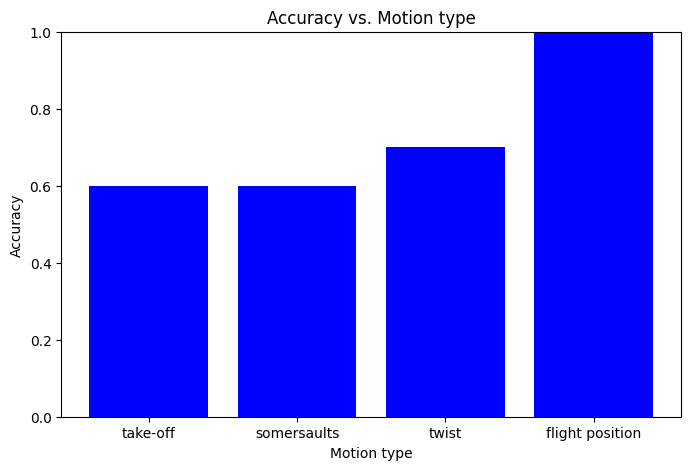

In [28]:
motion = ["take-off", "somersaults", "twist", "flight position"]

# Plotting
plt.figure(figsize=(8, 5))
plt.bar(motion, correct, color='blue')
plt.xlabel('Motion type')
plt.ylabel('Accuracy')
plt.title('Accuracy vs. Motion type')
plt.ylim(0, 1)  # Set y-axis limit from 0 to 1
plt.show()